In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/image-matching-challenge-2023/sample_submission.csv
/kaggle/input/image-matching-challenge-2023/test/README.md
/kaggle/input/image-matching-challenge-2023/train/train_labels.csv
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/LICENSE.txt
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/IMG_0079.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/3DOM_FBK_IMG_1520.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/IMG_0068.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/IMG_0286.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/3DOM_FBK_IMG_1556.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/IMG_0266.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/IMG_0216.png
/kaggle/input/image-matching-challenge-2023/train/heritage/dioscuri/images/IMG_0444.png
/kaggl

# 3D Scene Reconstruction Pipeline and its Optimization
Team: Shi Zhang, Zhizhou Gu

Data Source: image-matching-challenge-2023, a subset from Google Landmark Dataset

# Overview

This remote pipeline aims to reconstruct 3D scenes from a collection of 2D images. It involves several steps from preprocessing images to visualizing the reconstructed 3D scene.

* Detect 2D features in every input image.
* Match 2D features between images.
* Construct 2D tracks from the matches.
* Solve for the SfM model from the 2D tracks.
* Refine the SfM model using bundle adjustment.

# Step 0: Import libraries

In [4]:
!pip install mediapy -q
!apt-get update
!apt-get install -y libgl1-mesa-glx


[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Get:1 http://deb.debian.org/debian bookworm InRelease [151 kB]
Get:2 http://deb.debian.org/debian bookworm-updates InRelease [52.1 kB]
Get:3 http://deb.debian.org/debian-security bookworm-security InRelease [48.0 kB]
Get:4 http://deb.debian.org/debian bookworm/main amd64 Packages [8787 kB]
Get:5 http://deb.debian.org/debian bookworm-updates/main amd64 Packages [6668 B]
Get:6 http://deb.debian.org/debian-security bookworm-security/main amd64 Packages [127 kB]
Fetched 9172 kB in 2s (3738 kB/s)                         
Reading package lists... Done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libdrm-amdgpu1 libdrm-common libdrm-intel1 libdrm-nouveau2 libdrm-radeon1
  libdrm2 libgl1 libgl1-mesa-dri libglapi-mesa libglvnd0 libglx-mesa0 libglx0
  libllvm15 libpciaccess0 libse

In [5]:
%cd /kaggle/working/
!rm -rf /kaggle/working/Hierarchical-Localization
!git clone --quiet --recursive https://github.com/cvg/Hierarchical-Localization/
%cd /kaggle/working/Hierarchical-Localization
!pip install -e .

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_exhaustive
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

%cd /kaggle/working/

/kaggle/working


/usr/local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/kaggle/working/Hierarchical-Localization
Obtaining file:///kaggle/working/Hierarchical-Localization
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/cvg/LightGlue to /tmp/pip-install-omhgd0sd/lightglue_16e9eb3be32c4073830358f8e1362f7a
  Running command git clone --filter=blob:none --quiet https://github.com/cvg/LightGlue /tmp/pip-install-omhgd0sd/lightglue_16e9eb3be32c4073830358f8e1362f7a
  Resolved https://github.com/cvg/LightGlue to commit b1cd942fc4a3a824b6aedff059d84f5c31c297f6
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 6.5 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 61.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.7/705.7 kB 14.4 MB/s eta 0:00:0000:01
  Created wheel for lightglue: filename=lightglue-0.0-py3-none-any.whl size=38492 sha256

/usr/local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [6]:
import os
import cv2
import numpy as np
import pandas as pd

import pycolmap
import mediapy as media
import plotly.express as px
import plotly.graph_objects as go

from matplotlib import pyplot as plt
from glob import glob
from pathlib import Path
from time import time

# Step 1: Preprocess the images

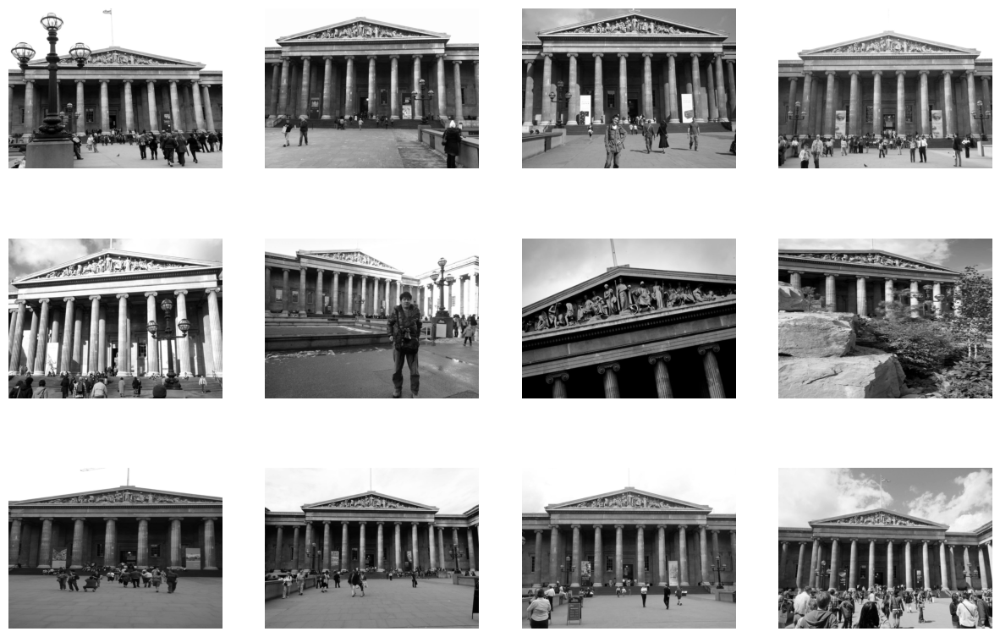

In [8]:
import cv2
from glob import glob 
import matplotlib.pyplot as plt

# Dataset and scene specifics
dataset = 'phototourism'
scene = 'british_museum'
src = f'/kaggle/input/image-matching-challenge-2023/train/{dataset}/{scene}'
limit = 12
images = [cv2.cvtColor(cv2.imread(im), cv2.COLOR_BGR2RGB) for im in glob(f'{src}/images/*')[:limit]]

# Function to preprocess images
def preprocess_image(image, size=(1024, 768), convert_gray=True):
    img = cv2.resize(image, size)
    if convert_gray:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return img

# Loading and preprocessing images (now converted to grayscale)
processed_images = [preprocess_image(img) for img in images]

# Displaying the grayscale images using matplotlib
plt.figure(figsize=(15, 10))
for i, img in enumerate(processed_images):
    plt.subplot(3, 4, i + 1)
    plt.imshow(img, cmap='gray')  # Specify the color map as 'gray'
    plt.axis('off')
plt.show()

# Step 2: Feature Matching

In [9]:
import cv2
from matplotlib import pyplot as plt

def match_features_sift(image1, image2, n_matches=10):
    # Initialize SIFT detector
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors
    keypoints1, descriptors1 = sift.detectAndCompute(image1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(image2, None)

    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Apply ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    # Sort the matches based on distance
    good_matches = sorted(good_matches, key=lambda x: x.distance)

    # Keep only the top matches
    good_matches = good_matches[:n_matches]

    # Store match data for later use (optional)
    match_data = [(keypoints1[m.queryIdx], keypoints2[m.trainIdx]) for m in good_matches]

    return good_matches, match_data, keypoints1, keypoints2

In [10]:
def create_match_visualizations(image1, image2, keypoints1, keypoints2, matches):
    # Create the visualization of the matched features
    matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches, None)

    return matched_image

In [12]:
def save_match_visualizations(image1, image2, keypoints1, keypoints2, matches, file_name):
    # Create the directory if it does not exist
    os.makedirs(os.path.dirname(file_name), exist_ok=True)

    matched_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches, None)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(matched_image)
    plt.axis('off')
    plt.savefig(file_name, bbox_inches='tight')
    plt.close()


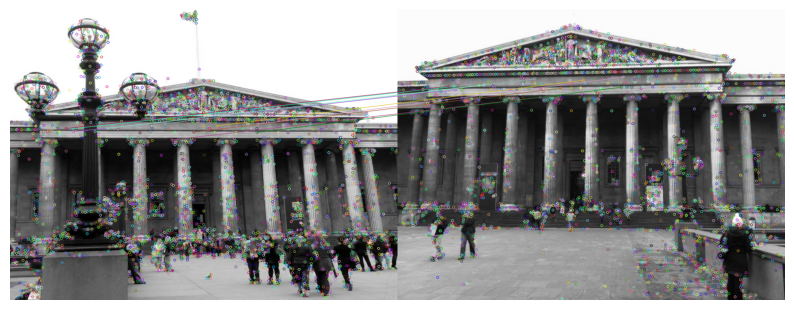

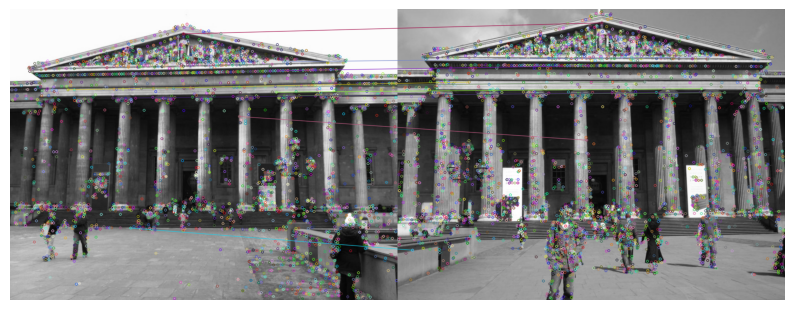

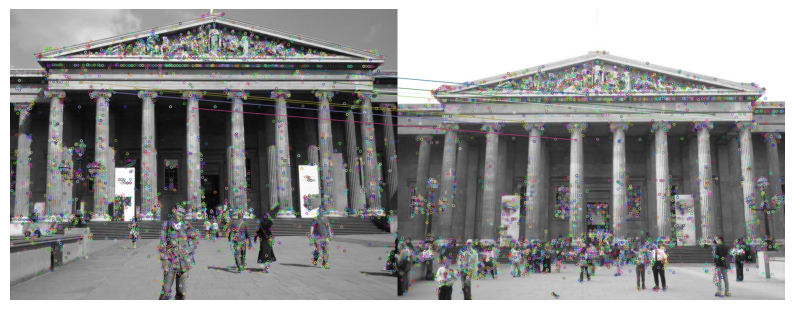

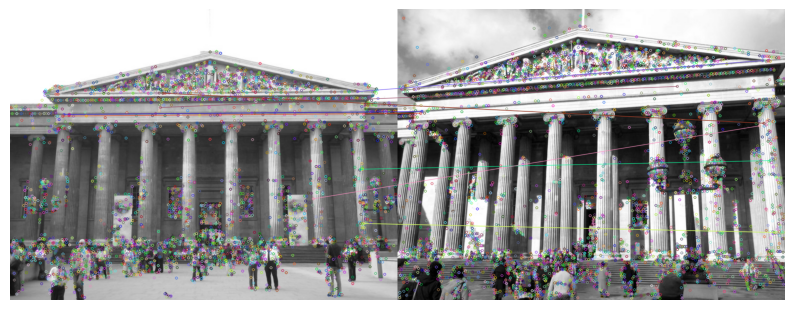

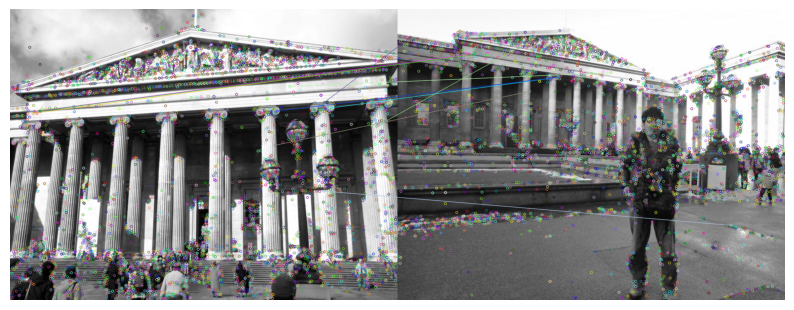

...

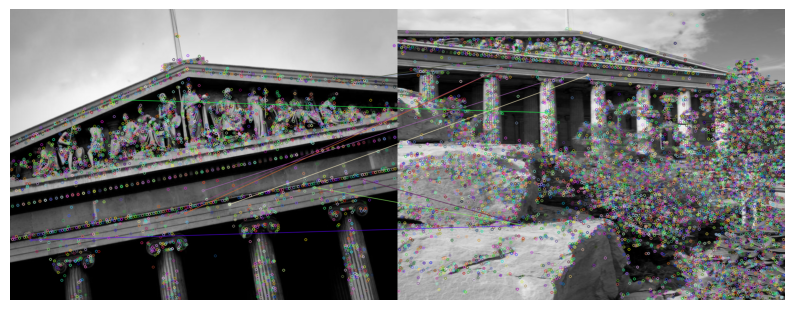

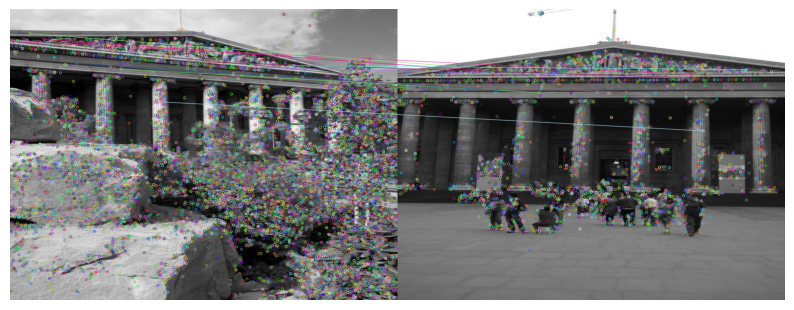

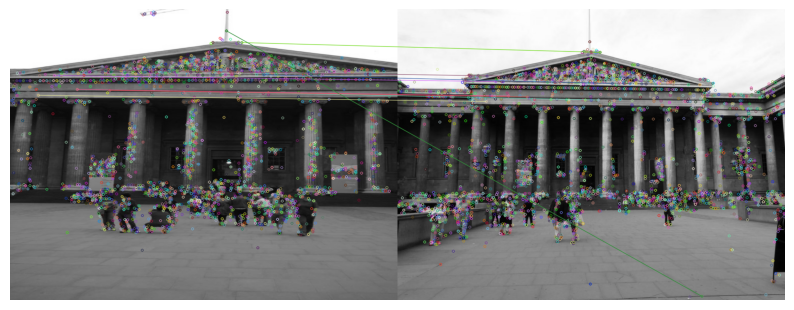

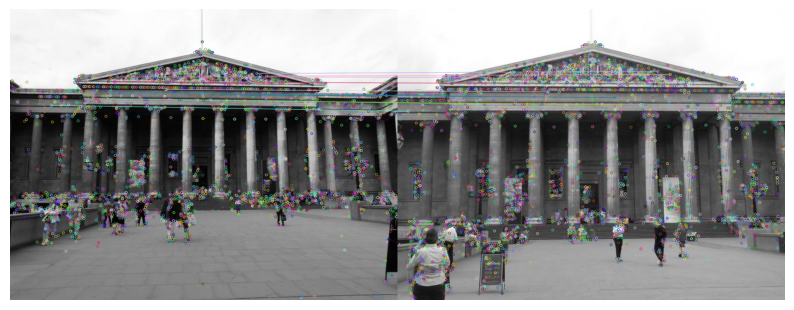

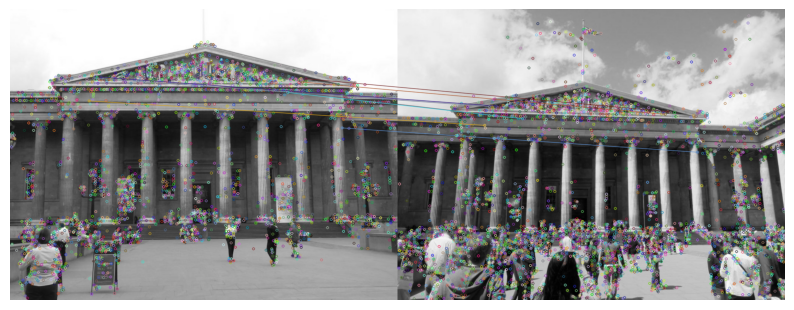

In [13]:
import matplotlib.pyplot as plt

# Define the number of columns for subplot
columns = 2

# Loop through the images, process them, and display the results
for i in range(len(processed_images) - 1):
    image1, image2 = processed_images[i], processed_images[i + 1]
    matches, match_data, keypoints1, keypoints2 = match_features_sift(image1, image2)
    matched_image = create_match_visualizations(image1, image2, keypoints1, keypoints2, matches)
    save_match_visualizations(image1, image2, keypoints1, keypoints2, matches, f'/kaggle/working/feature/{dataset}/{scene}/match_{i}_{i+1}.png')
    
    # Display the matched image
    plt.figure(figsize=(10, 5))
    plt.imshow(matched_image)
    plt.axis('off')
    plt.show()

# Step 3: Using SfM (Structure from Motion)

In [15]:
# Dataset and scene specifics
dataset = 'phototourism'
scene = 'british_museum'
src = f'/kaggle/input/image-matching-challenge-2023/train/{dataset}/{scene}'

In [16]:
def parse_cameras(file_path):
    cameras = {}
    with open(file_path, 'r') as file:
        for line in file:
            if line.startswith("#"):  # Skip comments
                continue
            parts = line.split()
            camera_id = int(parts[0])
            model = parts[1]
            width, height = map(int, parts[2:4])
            params = list(map(float, parts[4:]))
            cameras[camera_id] = {"model": model, "width": width, "height": height, "params": params}
    return cameras

In [17]:
cameras_file_path = f'{src}/sfm/cameras.txt'
cameras = parse_cameras(cameras_file_path)

In [18]:
def parse_images(file_path):
    images = {}
    with open(file_path, 'r') as file:
        lines = file.readlines()
        for i in range(0, len(lines), 2):
            if lines[i].startswith("#"):
                continue
            img_data = lines[i].split()
            img_id = int(img_data[0])
            qw, qx, qy, qz, tx, ty, tz = map(float, img_data[1:8])
            camera_id = int(img_data[8])
            img_name = img_data[9]
            images[img_id] = {"camera_id": camera_id, "q": [qw, qx, qy, qz], "t": [tx, ty, tz], "name": img_name}
    return images

In [19]:
images_file_path = f'{src}/sfm/images.txt'
images = parse_images(images_file_path)

In [20]:
def parse_points3D(file_path):
    points3D = {}
    with open(file_path, 'r') as file:
        for line in file:
            if line.startswith("#"):
                continue
            parts = line.split()
            point_id = int(parts[0])
            xyz = list(map(float, parts[1:4]))
            color = list(map(int, parts[4:7]))
            points3D[point_id] = {"xyz": xyz, "color": color}
    return points3D

In [21]:
points3D_file_path = f'{src}/sfm/points3D.txt'
points3D = parse_points3D(points3D_file_path)

# Step 4: 3D Reconstruction

In [22]:
!pip install pycolmap


[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [23]:
import pycolmap

# Initialize a reconstruction object
rec_gt = pycolmap.Reconstruction(f'{src}/sfm')

In [24]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, rec_gt, cameras = False, color='rgba(156,153,140,0.5)', name="Ground Truth", cs=5)
fig.show()

# Step 5: Save the 3d Scene

In [32]:
!pip install pyntcloud

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 346.3/346.3 kB 6.6 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


In [ ]:
# Dataset and scene specifics
dataset = 'phototourism'
scene = 'british_museum'

In [35]:
import os
import pycolmap
import numpy as np
import pandas as pd
from pyntcloud import PyntCloud

# Specify your dataset and scene
dataset = 'phototourism' 
scene = 'british_museum'

# Define the output directory and file
output_dir = f'/kaggle/working/3d_scene/{dataset}/{scene}/'
output_file = os.path.join(output_dir, 'point_cloud.ply')

# Load the reconstruction
reconstruction = pycolmap.Reconstruction()
reconstruction.read(f'{src}/sfm')

# Get the 3D points and their colors
points = np.array([point.xyz for point in reconstruction.points3D.values()])

# Write the points to a .ply file
d = {'x': points[:,0],'y': points[:,1],'z': points[:,2]}
cloud = PyntCloud(pd.DataFrame(data=d))
cloud.to_file(output_file)


/usr/local/lib/python3.10/site-packages/pyntcloud/io/ply.py:260: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/site-packages/pyntcloud/io/ply.py:260: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.10/site-packages/pyntcloud/io/ply.py:260: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

